In [1]:
import scanpy as sc
import pandas as pd
import glob
import numpy as np
import matplotlib.pylab as plt
import scipy.stats as stats
import pegasus as pg

In [2]:
sc.set_figure_params(dpi=200)
sc.settings.verbosity = 3

In [3]:
import QCPipe as qc

In [4]:
data = qc.read_dropest("Data")

Calculating QC Metrics
Inflection point at [20549 38670 56792] for [0, 15, 30] percentiles of greatest secant distances


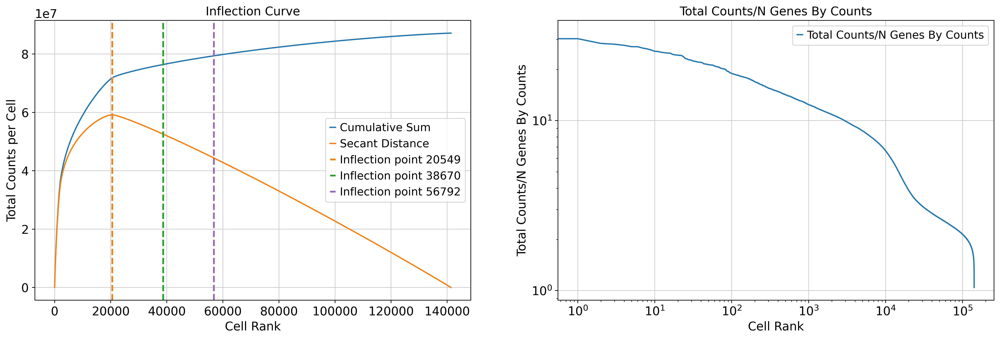

In [5]:
inf = qc.find_inflection(data)

In [6]:
sc.pp.filter_cells(data,min_counts=data[inf[0]].obs.total_counts[0])

filtered out 120809 cells that have less than 619.0 counts


In [7]:
data

AnnData object with n_obs × n_vars = 20553 × 29426
    obs: 'total_counts', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Mitochondrial', 'log1p_total_counts_Mitochondrial', 'pct_counts_Mitochondrial', 'n_counts'
    var: 'Mitochondrial', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'Order'

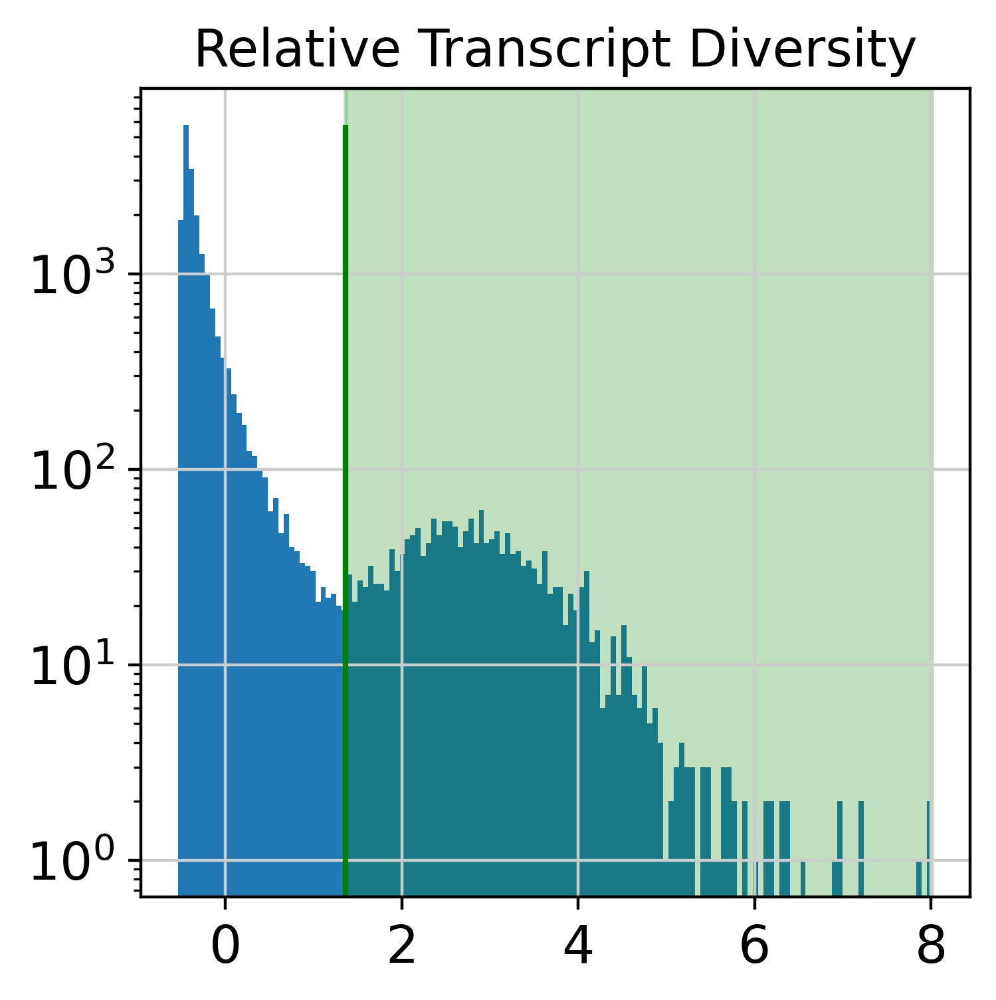

In [8]:
data = qc.relative_diversity(data)

In [9]:
sc.pp.normalize_total(data)

normalizing counts per cell
    finished (0:00:00)


In [10]:
data.X = np.arcsinh(data.X).copy()

In [11]:
sc.pp.scale(data)

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [12]:
sc.pp.pca(data)

computing PCA
    with n_comps=50
    finished (0:01:22)


In [13]:
neighborhood_k = np.sqrt(data.n_obs).astype(int)

In [14]:
pg.neighbors(data, K=neighborhood_k,full_speed=True)

2020-10-09 13:46:06,326 - pegasus - INFO - Time spent on 'get_neighbors' = 0.45s.
2020-10-09 13:46:07,192 - pegasus - INFO - Time spent on 'calculate_affinity_matrix' = 0.87s.


In [15]:
pg.umap(data,n_neighbors=neighborhood_k,min_dist=0.25)

2020-09-16 14:38:22,073 - pegasus - INFO - UMAP(min_dist=0.25, n_neighbors=143, random_state=0, verbose=True)
2020-09-16 14:38:22,074 - pegasus - INFO - Construct fuzzy simplicial set
2020-09-16 14:38:24,776 - pegasus - INFO - Construct embedding
	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
2020-09-16 14:38:47,787 - pegasus - INFO - UMAP is calculated. Time spent = 25.73s.
2020-09-16 14:38:47,788 - pegasus - INFO - Time spent on 'umap' = 25.73s.


In [16]:
#pd.DataFrame(data.obsm['X_umap']).to_csv("X_umap.csv")

In [16]:
data.obsm['X_umap'] = pd.read_csv("X_umap.csv",index_col=0).values

In [35]:
pg.leiden(data,resolution=2,random_state=0)

2020-10-09 14:12:40,321 - pegasus - INFO - Time spent on 'construct_graph' = 1.65s.
2020-10-09 14:13:26,320 - pegasus - INFO - Leiden clustering is done. Get 24 clusters. Time spent = 47.65s.


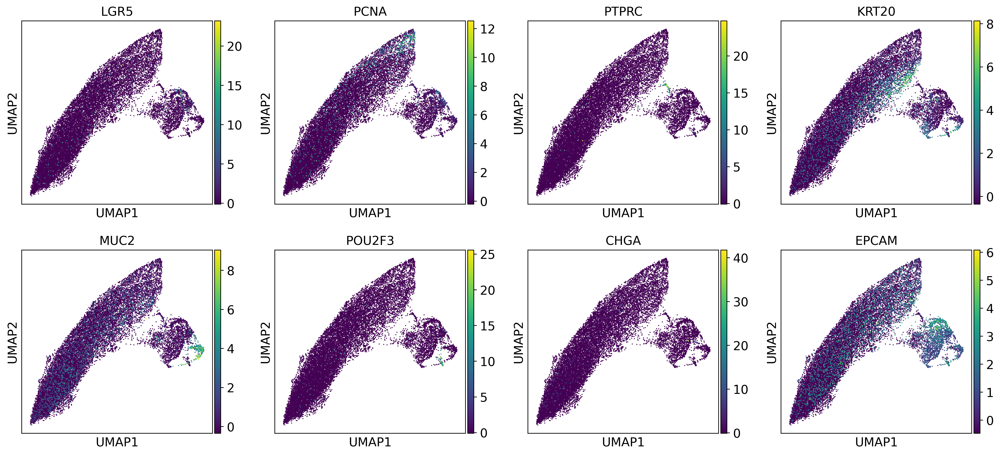

In [36]:
sc.pl.umap(data,color=['LGR5','PCNA','PTPRC','KRT20','MUC2','POU2F3','CHGA','EPCAM'],use_raw=False)

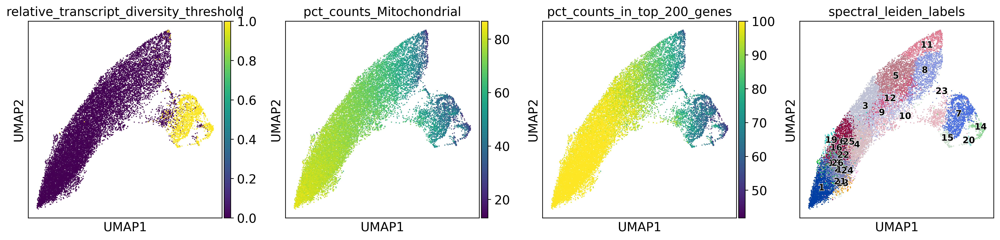

In [37]:
sc.pl.umap(data,color=['relative_transcript_diversity_threshold','pct_counts_Mitochondrial','pct_counts_in_top_200_genes','spectral_leiden_labels'],legend_loc='on data',legend_fontoutline=True,legend_fontsize=10)

In [38]:
selected_clusters = ['7','15','14','20','23']

In [39]:
data.obs['Cell_Selection'] = np.isin(data.obs['spectral_leiden_labels'],selected_clusters).astype(bool)

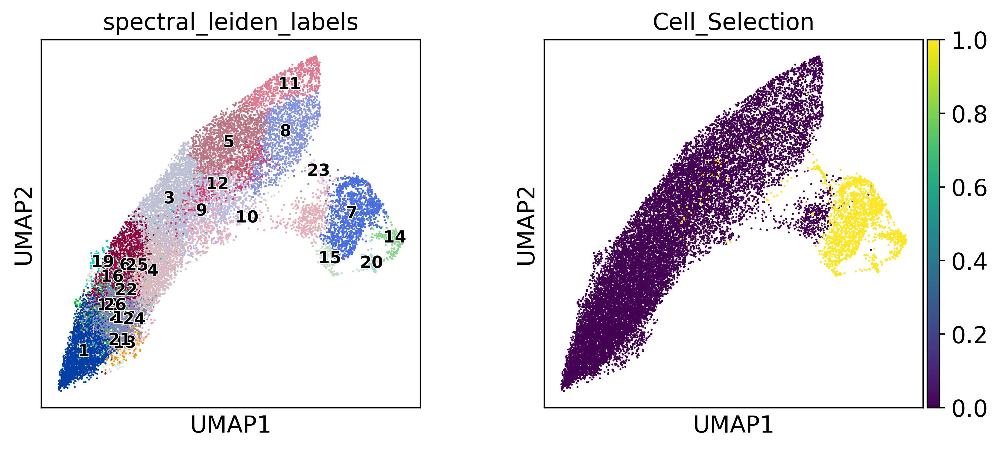

In [40]:
sc.pl.umap(data,color=['spectral_leiden_labels','Cell_Selection'],legend_loc='on data',legend_fontoutline=True,legend_fontsize=10)

In [41]:
data

AnnData object with n_obs × n_vars = 20553 × 29426
    obs: 'total_counts', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_Mitochondrial', 'log1p_total_counts_Mitochondrial', 'pct_counts_Mitochondrial', 'n_counts', 'n_genes_by_counts_zscore', 'relative_transcript_diversity_threshold', 'spectral_leiden_labels', 'Cell_Selection', 'leiden_labels'
    var: 'Mitochondrial', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mean', 'std'
    uns: 'Order', 'pca', 'pca_knn_indices', 'pca_knn_distances', 'W_pca', 'diffmap_evals', 'spectral_leiden_labels_colors'
    obsm: 'X_pca', 'X_umap', 'X_diffmap', 'X_phi'
    varm: 'PCs'

In [42]:
data_out = qc.subset_cleanup(data,selection='Cell_Selection')

In [43]:
data_out

AnnData object with n_obs × n_vars = 2202 × 29426

In [44]:
data_out.write_h5ad("Filtered_Data.h5ad",compression='gzip')